In [1]:
# Make sure to install the requirements with pip install -r requirements.txt
import os
from matplotlib import pyplot as plt
import numpy as np
import torch
from sklearn.decomposition import PCA
from argparse import Namespace
from tqdm.notebook import tqdm
from lib.model import get_model_and_optim
from lib.data import prepare_nuclear_data
from lib.utils import preds_targets_zn, PlottingContext, IO, get_rms, get_rms_no_outliers

  0%|          | 0/20000 [00:00<?, ?it/s]

Epoch 0: 0.54
Train RMS binding: 860159.03 (852827.06) Epoch 2000: 0.00
Train RMS binding: 13294.40 (12785.52) Epoch 4000: 0.00
Train RMS binding: 12872.34 (12363.36) Epoch 6000: 0.00
Train RMS binding: 2448.12 (2245.37) Epoch 8000: 0.00
Train RMS binding: 686.31 (625.91) Epoch 10000: 0.00
Train RMS binding: 244.86 (224.28) Epoch 12000: 0.00
Train RMS binding: 186.38 (179.06) Epoch 14000: 0.00
Train RMS binding: 314.69 (310.79) Epoch 16000: 0.00
Train RMS binding: 216.50 (213.88) Epoch 18000: 0.00
Train RMS binding: 25.76 (24.28) 

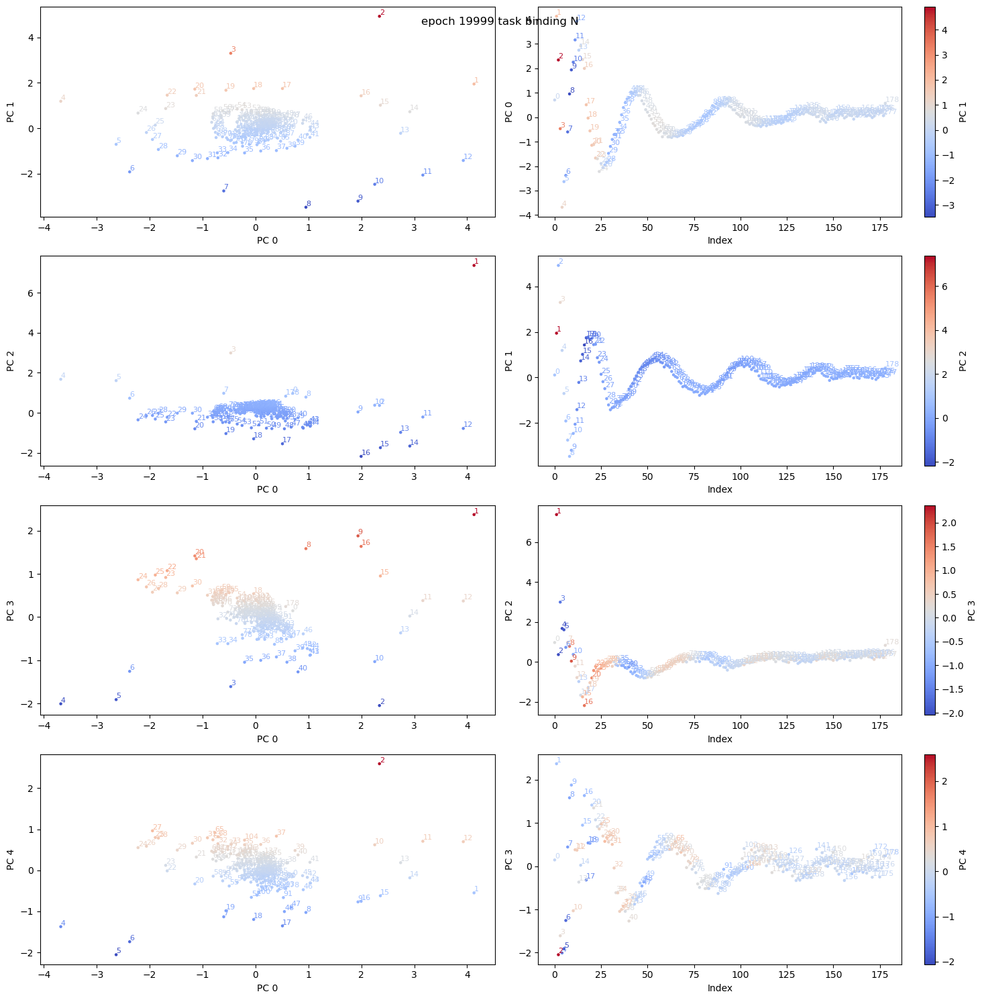

In [ ]:
# loop

for task in ["binding"]:
    experiment_name = f"which_task_has_what_feature_2/{task}"
    os.makedirs("experiments", exist_ok=True)
    os.makedirs(f"experiments/{experiment_name}", exist_ok=True)
    args = {
        "DEPTH": 2,
        "DEV": (device:="cuda"),
        "EPOCHS": 20_000,
        "HIDDEN_DIM": 2048,
        "LR": 0.0001,
        "MODEL": "baseline",
        "SIGMOID_READOUT": "false",
        "TMS": "remove",
        "WD": 0.01,
        "DEV": "cuda",
        "TARGETS_CLASSIFICATION": {},
        "TARGETS_REGRESSION": {f"{task}": 100},
        "TRAIN_FRAC": 1,
        "LIPSCHITZ": "false",
        "TRAIN_SET": "all_data", # random, all_data, extrap_1, extrap_2, extrap_3
        "BATCH_SIZE": 1024,
        "LOG_TIMES": 10,
        "NUCLEI_GE": 0,
        "NUCLEI_HIGH_UNC": "keep",
        "PER_NUCLEON": "true",
        "SEED": 0,
    }

    args = Namespace(**args)

    # IO.save_args(args, f"experiments/{experiment_name}/args.yaml")

    data = prepare_nuclear_data(args)


    # setup training data
    X_train = data.X[data.train_mask]
    y_train = data.y[data.train_mask]
    non_nan_targets = ~torch.isnan(y_train.view(-1))
    X_train = X_train[non_nan_targets]
    y_train = y_train[non_nan_targets]

    def quick_eval(model, task="binding", verbose=True, train=False):
        """helper to get the rms for the franken model"""
        preds, targets, zn = preds_targets_zn(data, model, task, train=train)
        rms = get_rms(preds, targets, zn, scale_by_A=True)
        rms_clip = get_rms_no_outliers(preds, targets, zn, scale_by_A=args.PER_NUCLEON=="true")
        if verbose:
            print(f"RMS for franken model: {rms:.2f}")
            print(f"RMS for franken model (clipped): {rms_clip:.2f}")
        return rms, rms_clip

    torch.manual_seed(1)
    new_model, optim_model = get_model_and_optim(data, args)

    # train the new model
    epochs = args.EPOCHS
    task_name = list(data.output_map.keys())[0]
    for epoch in (pbar:=tqdm(range(epochs))):
        optim_model.zero_grad()
        preds = new_model(X_train)
        preds = preds.gather(1, X_train[:, 2].long().view(-1, 1))
        loss = torch.nn.functional.mse_loss(preds, y_train)
        loss.backward()
        optim_model.step()
        if epoch % (epochs//10) == 0:
            print(f"Epoch {epoch}: {loss.item():.2f}")
            train_rms = quick_eval(new_model, task_name, verbose=False, train=True)
            # val_rms = quick_eval(new_model, "binding", verbose=False, train=False)
            print(f"Train RMS {task_name}: {train_rms[0]:.2f} ({train_rms[1]:.2f})", end=" ")
            # print(f"Val RMS: {val_rms[0]:.2f} ({val_rms[1]:.2f})")
            embed = new_model.emb[1].detach().cpu().numpy()
            # PlottingContext.plot_embedding(embed, num_components=3); plt.show()
        pbar.set_description(f"Epoch {epoch}: {loss.item():.2e}")

    # let's take a look at our embeddings
    nucleons = "ZN" 
    embed = new_model.emb[(nucleon:=1)].detach().cpu().numpy()
    fig = PlottingContext.plot_embedding(embed, num_components=5)
    fig.suptitle(f"epoch {epoch} task {task_name} {nucleons[nucleon]}")
    fig.savefig(f"experiments/{experiment_name}/embedding.png", dpi=300)
    fig.show()

# Load data and config

In [19]:
# load args from disk
task = "binding"
# experiment_name = f"which_task_has_what_feature/{task}"
experiment_name = f"nice_features_BE_only"
os.makedirs("experiments", exist_ok=True)
os.makedirs(f"experiments/{experiment_name}", exist_ok=True)
args = {
    "DEPTH": 2,
    "DEV": (device:="cuda"),
    "EPOCHS": 20_000,
    "HIDDEN_DIM": 2048,
    "LR": 0.0001,
    "MODEL": "baseline",
    "SIGMOID_READOUT": "false",
    "TMS": "remove",
    "WD": 0.01,
    "DEV": "cuda",
    "TARGETS_CLASSIFICATION": {},
    "TARGETS_REGRESSION": {f"{task}": 100,
                        #    "z" : 1,
                        #    "n" : 1,
    #  "radius": 0.01
     },

    "TRAIN_FRAC": 1,
    "LIPSCHITZ": "false",
    "TRAIN_SET": "all_data", # random, all_data, extrap_1, extrap_2, extrap_3
    "BATCH_SIZE": 1024_000,
    "LOG_TIMES": 10,
    "NUCLEI_GE": 0, 
    "NUCLEI_HIGH_UNC": "keep", # remove, keep
    "PER_NUCLEON": "true",
    "SEED": 0,
    "USE_LOSS_WEIGHTS": "false",
}

args = Namespace(**args)

# IO.save_args(args, f"experiments/{experiment_name}/args.yaml")

data = prepare_nuclear_data(args)

In [20]:
# setup training data
X_train = data.X[data.train_mask]
y_train = data.y[data.train_mask]
non_nan_targets = ~torch.isnan(y_train.view(-1))
X_train = X_train[non_nan_targets]
y_train = y_train[non_nan_targets]


def transform(tensor):
    min_ = torch.tensor(data.regression_transformer.data_min_.tolist(), device=tensor.device)
    max_ = torch.tensor(data.regression_transformer.data_max_.tolist(), device=tensor.device)
    return (tensor * (max_ - min_)) + min_

torch.manual_seed(1)
new_model, optim_model = get_model_and_optim(data, args)

# Training

  0%|          | 0/20000 [00:00<?, ?it/s]

epoch0, loss5.39e-01, Train RMS binding: 860159.03 

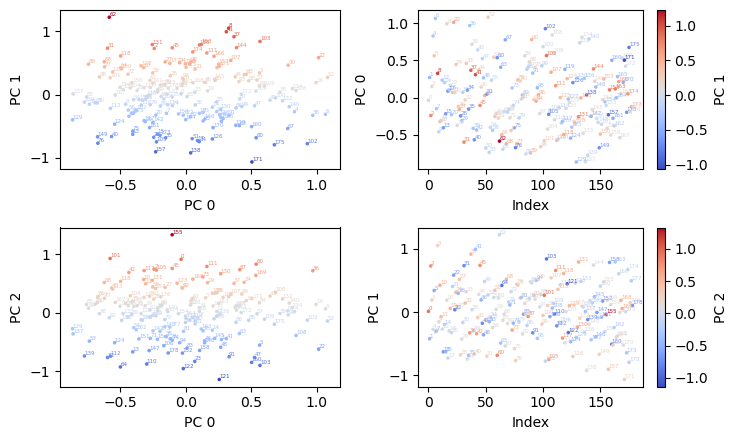

epoch2000, loss1.13e-03, Train RMS binding: 13294.40 

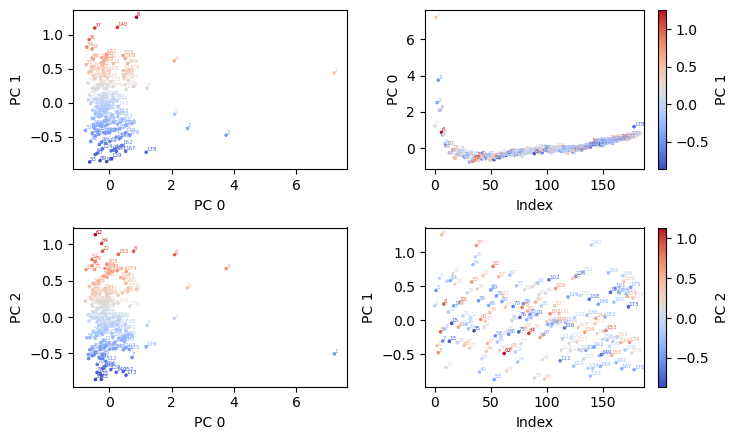

epoch4000, loss9.48e-04, Train RMS binding: 12872.34 

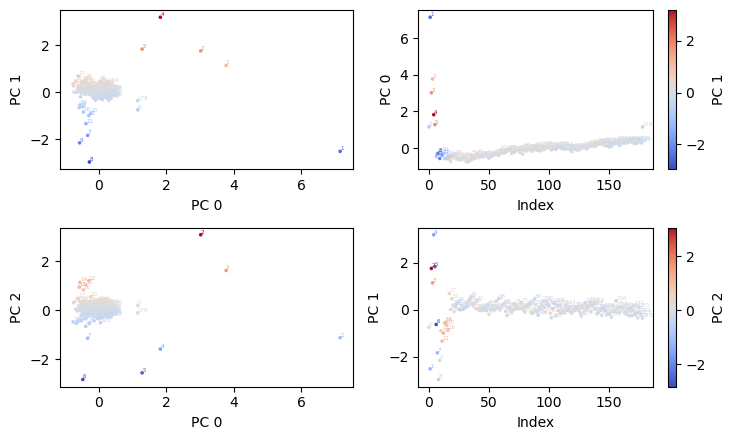

epoch6000, loss1.41e-05, Train RMS binding: 2448.12 

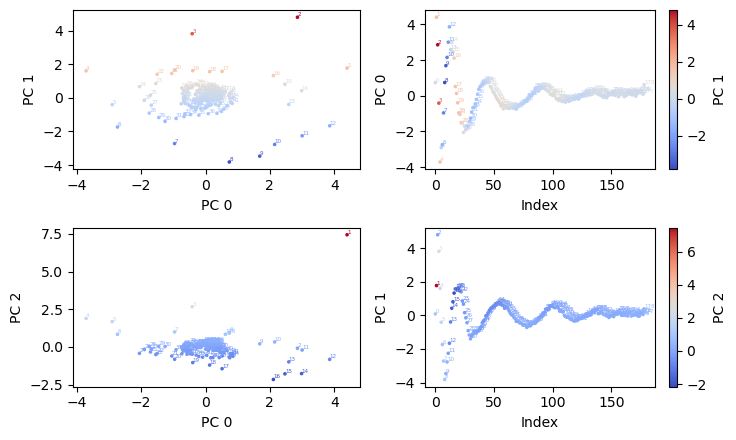

epoch8000, loss6.61e-07, Train RMS binding: 686.31 

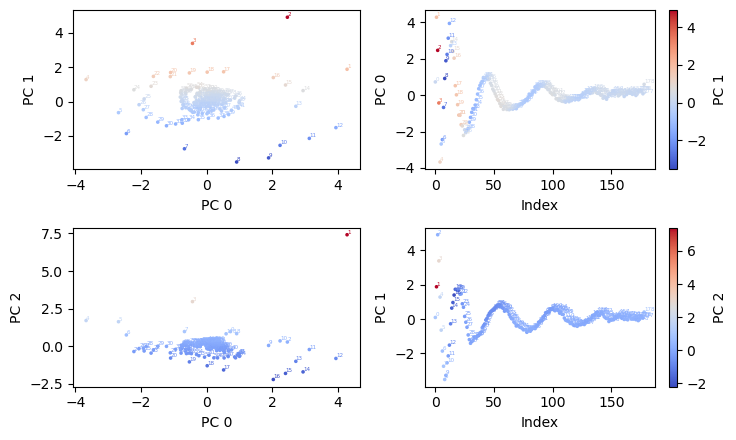

epoch10000, loss6.89e-08, Train RMS binding: 244.86 

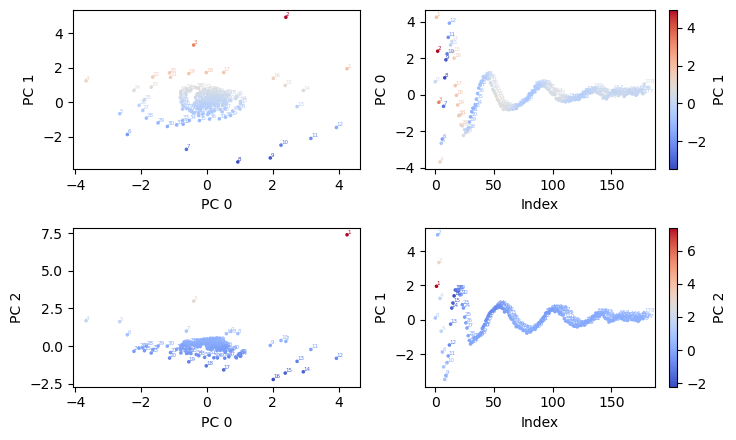

epoch12000, loss2.79e-08, Train RMS binding: 186.38 

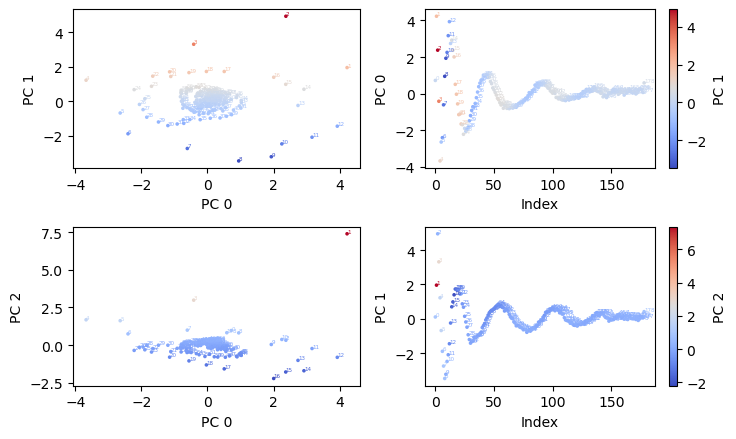

epoch14000, loss1.40e-08, Train RMS binding: 314.69 

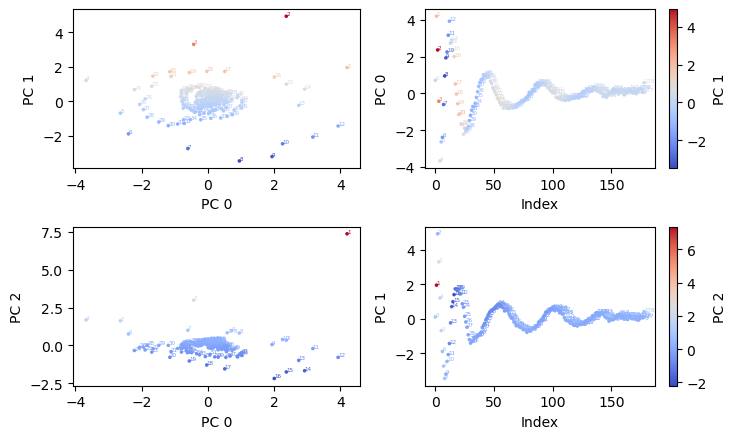

epoch16000, loss2.02e-08, Train RMS binding: 216.50 

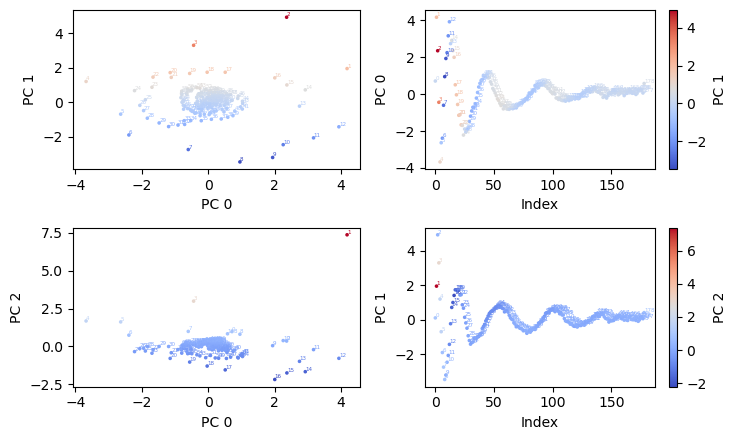

epoch18000, loss8.20e-10, Train RMS binding: 25.76 

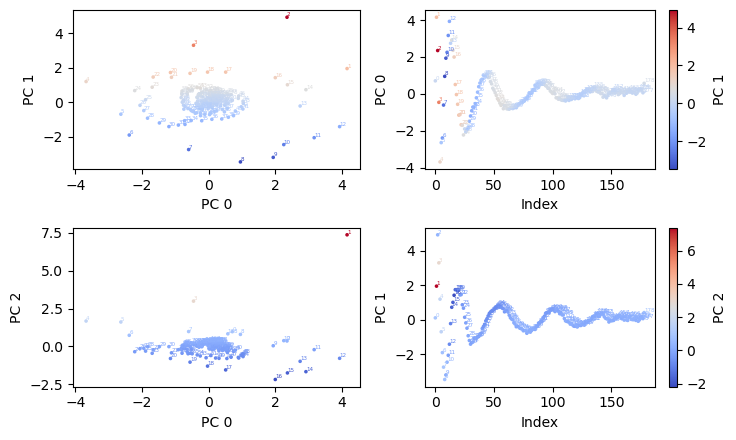

In [21]:
# train the new model
def evaluate_loss(outputs, targets, use_weights=False, rescale_outputs=False):
    if rescale_outputs:
        outputs = transform(outputs)
    if use_weights:
        weights = 1 / torch.tensor(list(args.TARGETS_REGRESSION.values()), device=X_train.device).view(-1)
        weights = weights[X_train[:, 2].long().view(-1, 1)]
    else:
        weights = 1

    preds = outputs.gather(1, X_train[:, 2].long().view(-1, 1))
    losses = torch.nn.functional.mse_loss(preds, targets, reduction="none")
    return (losses * weights).mean()


epochs = args.EPOCHS
task_name = list(data.output_map.keys())[0]
for epoch in (pbar:=tqdm(range(epochs))):
    optim_model.zero_grad()
    outputs = new_model(X_train)
    loss =  evaluate_loss(outputs, y_train, use_weights=args.USE_LOSS_WEIGHTS=="true", rescale_outputs=False)

    loss.backward()
    optim_model.step()
    if epoch % (epochs//10) == 0:
        # Compute train RMS
        # outputs = new_model(X_train)
        # preds = transform(outputs)
        # preds = preds.gather(1, X_train[:, 2].long().view(-1, 1))

        # task_mask = X_train[:, 2] == 0
        # mask = lambda x: x[task_mask].cpu().detach().squeeze().numpy()
        # task_preds, task_targets, task_zn = mask(preds), mask(y_train), mask(X_train[:, :2])
        task_preds, task_targets, task_zn = preds_targets_zn(data, new_model, task_name, train=True)
        train_rms = get_rms(task_preds, task_targets, task_zn, scale_by_A=args.PER_NUCLEON=="true")
        print(f"epoch{epoch}, loss{loss.item():.2e}, Train RMS {task_name}: {train_rms:.2f}", end=" ")
        embed = new_model.emb[1].detach().cpu().numpy()
        PlottingContext.plot_embedding(embed, num_components=3, figscale=0.5); plt.show()
    pbar.set_description(f"Epoch {epoch}: {loss.item():.2e}")

# save the model
torch.save(new_model.state_dict(), f"experiments/{experiment_name}/model.pt")
IO.save_args(args, f"experiments/{experiment_name}/args.yaml")


# PCA Experiments

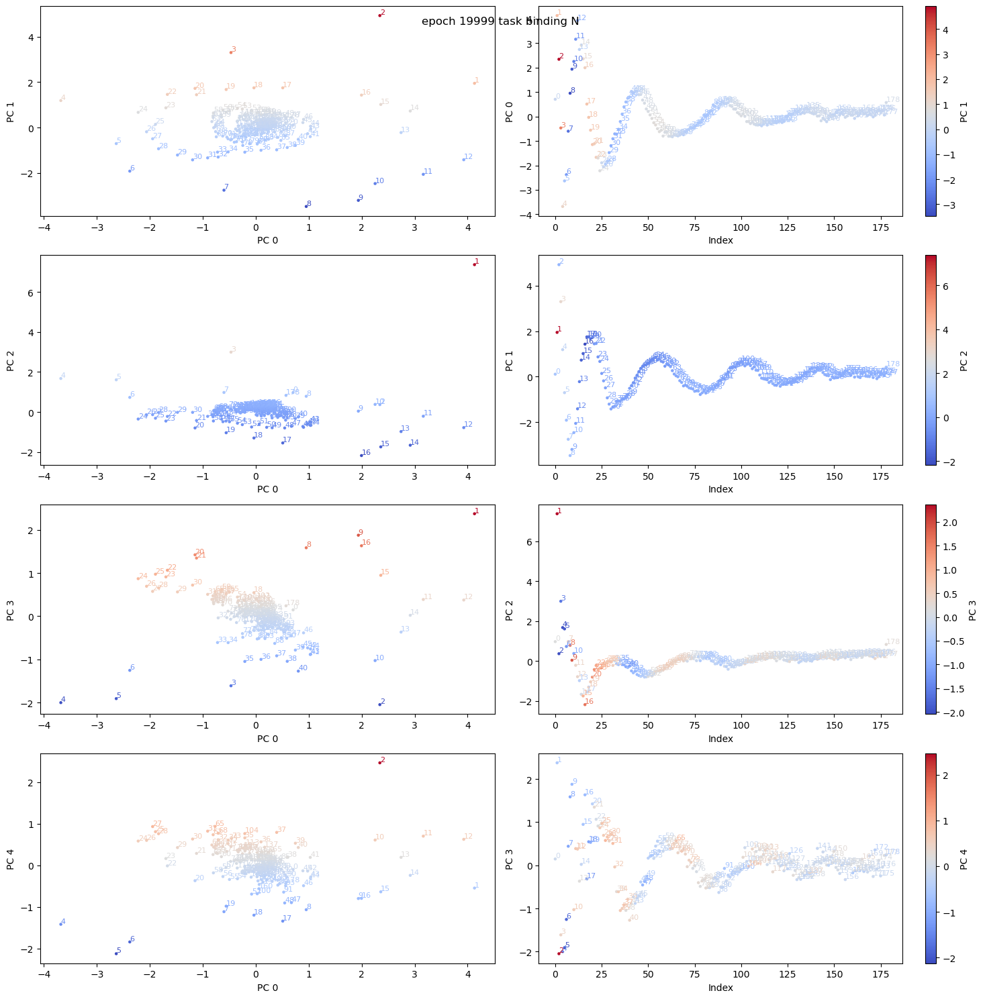

In [22]:
# let's take a look at our embeddings
nucleons = "ZN" 
embed = new_model.emb[(nucleon:=1)].detach().cpu().numpy()
fig = PlottingContext.plot_embedding(embed, num_components=5)
fig.suptitle(f"epoch {epoch} task {task_name} {nucleons[nucleon]}")
# fig.savefig(f"experiments/{experiment_name}/embedding.png", dpi=300)
fig.show()

In [23]:
def get_penultimate_acts(model, X):
    # Save the last layer activations
    acts = torch.zeros(len(X), args.HIDDEN_DIM, device=device)
    # save the activations fed into the readout layer
    hook = model.readout.register_forward_pre_hook(lambda m, i: acts.copy_(i[0].detach()))
    model(X)
    hook.remove()
    return acts

def output_to_rms(outputs, X, y):
    preds = transform(outputs)
    preds = preds.gather(1, X[:, 2].long().view(-1, 1))
    mask = lambda x: x[X[:, 2] == 0].cpu().detach().squeeze().numpy()
    preds, targets, zn = mask(preds), mask(y), mask(X[:, :2])
    rms = get_rms(preds, targets, zn, scale_by_A=args.PER_NUCLEON=="true")
    return rms

acts = get_penultimate_acts(new_model, X_train)
rms = output_to_rms(new_model.readout(acts), X_train, y_train)
print(f"RMS of readout layer: {rms:.2f}")

RMS of readout layer: 1211738.67


Text(0, 0.5, 'RMS [keV]')

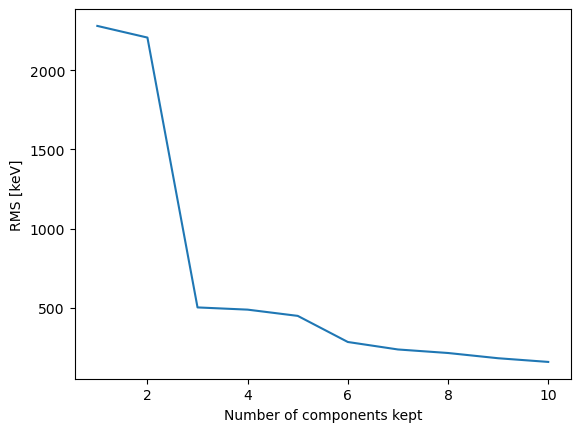

In [7]:
n_components = 10
pca = PCA(n_components=n_components)
pca.fit(acts.cpu().numpy())

# project to first n components
ns = np.arange(1, n_components+1)
rms_by_n = {}
for n in ns:
    acts_pca = pca.transform(acts.cpu().numpy())
    acts_pca[:, n:] = 0
    acts_ = pca.inverse_transform(acts_pca)
    acts_ = torch.tensor(acts_, device=device)
    rms = output_to_rms(new_model.readout(acts_), X_train, y_train)
    rms_by_n[n] = rms

plt.plot(ns, rms_by_n.values())
plt.xlabel("Number of components kept")
plt.ylabel("RMS [keV]")

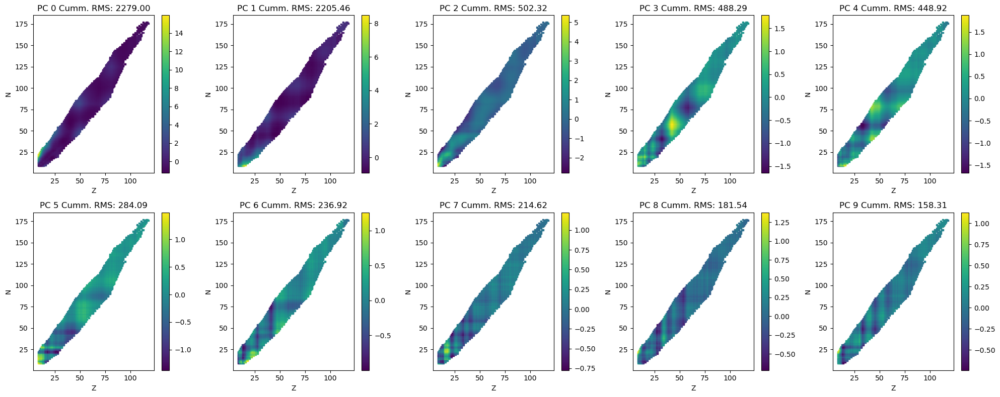

In [8]:
acts_pca = pca.transform(acts.cpu().numpy())
Z, N = X_train[:, :2].cpu().numpy().T

fig, axes = plt.subplots(2, 5, figsize=(20, 8))
for i in range(10):
    ax = axes[i//5, i%5]
    plt.sca(ax)
    plt.scatter(Z, N, c=acts_pca[:, i], cmap="viridis", s=4, marker="s")
    plt.xlabel("Z")
    plt.ylabel("N")
    plt.title(f"PC {i} Cumm. RMS: {rms_by_n[i+1]:.2f}")
    plt.colorbar()
fig.tight_layout()   
plt.show()

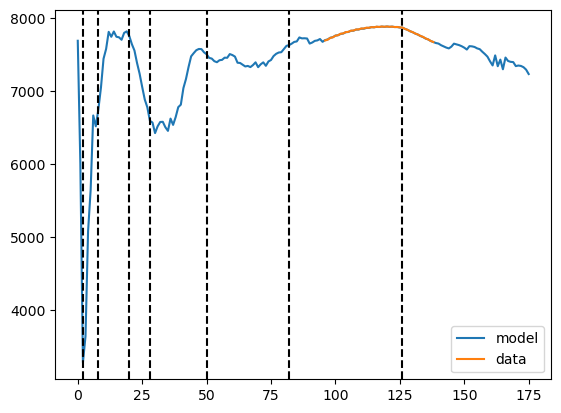

In [37]:
fixed_X = torch.arange(0, 176).view(-1, 1).to(device).repeat_interleave(3, dim=1)
fixed_X[:, 2] = 0
fixed_X[:, 0] = 82
magic_numbers = [2, 8, 20, 28, 50, 82, 126]
# plot the new model
with torch.no_grad():
    new_model.eval()
    preds = new_model(fixed_X)[:, 0]
    preds = preds.cpu().numpy()
    preds = data.regression_transformer.inverse_transform(preds.reshape(-1, 1)).reshape(-1)
    plt.plot(fixed_X[:, 1].cpu().numpy(), preds, label="model")
    N_data = data.X[:, 1][(data.X[:, 2] == 0) & (data.X[:, 0] == 82)].cpu().numpy()
    y = data.y[(data.X[:, 2] == 0) & (data.X[:, 0] == 82)][:, 0].cpu().numpy()
    plt.plot(N_data, y, label="data")
    for magic_number in magic_numbers:
        plt.axvline(magic_number, color="black", linestyle="--")
    plt.legend()
    plt.show()

In [49]:
X_train = data.X[~torch.isnan(data.y).view(-1)]
y_train = data.y[~torch.isnan(data.y).view(-1)]

X_train, y_train = X_train[X_train[:, 2] == 0],  y_train[X_train[:, 2] == 0]

# Save the last layer activations
acts = torch.zeros(len(X_train), 2048, device=device)
# save the activations fed into the readout layer
hook = new_model.readout.register_forward_pre_hook(lambda m, i: acts.copy_(i[0].detach()))
new_model(X_train)
hook.remove()

def inverse_transform(vector, index):
    """inverse transform the vector to the original scale"""
    scale = data.regression_transformer.data_max_[index] - data.regression_transformer.data_min_[index]
    min_ = data.regression_transformer.data_min_[index]
    vector = vector * scale + min_
    return vector

# Ensure that the RMS is the same as the franken model
def get_preds_from_last_acts(acts):
    preds = new_model.readout(acts) #- new_model.readout.bias
    preds = preds.detach().cpu().numpy()
    preds = data.regression_transformer.inverse_transform(preds)
    # preds = preds / data.regression_transformer.scale_ # + data.regression_transformer.min_
    return preds[:, 0]

def get_rms_from_last_acts(acts):
    preds = get_preds_from_last_acts(acts)
    targets = y_train.detach().cpu().numpy().reshape(-1)
    # targets = inverse_transform(targets, 0)
    zn = X_train[:, :2].detach().cpu().numpy()
    rms = get_rms(preds, targets, zn, scale_by_A=True)
    return rms
print(f"RMS recomputed: {get_rms_from_last_acts(acts):.2f}")

RMS recomputed: 2686.28
RMS for franken model: 2686.28
RMS for franken model (clipped): 2622.06


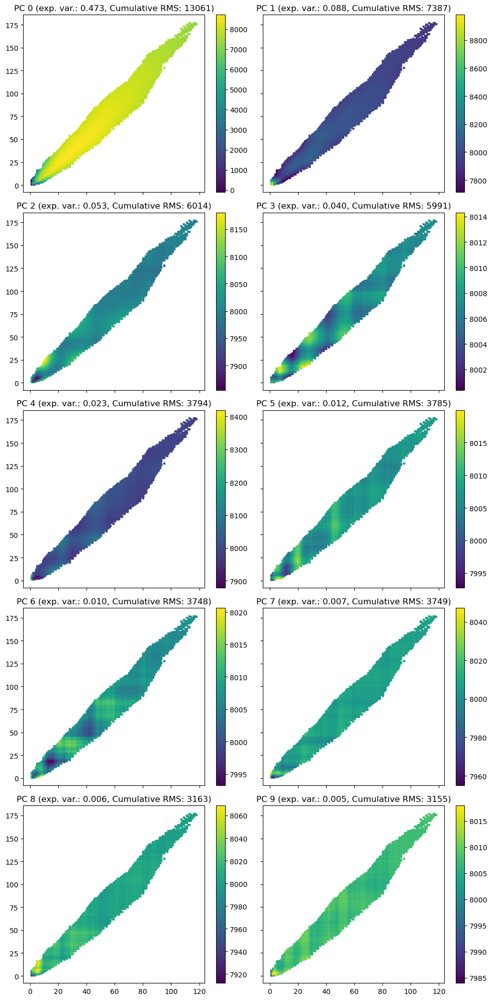

In [50]:
# last layer PCs
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

pca = PCA(n_components=100)
acts_pca = pca.fit_transform(acts.cpu().numpy())
# let's visualize all the PCs as a function of input
num_plots = min(acts_pca.shape[1], 10)
fig, axes = plt.subplots(num_plots//2, 2, figsize=(10, 2 * num_plots), sharex=True, sharey=True)
axes = axes.flatten()
Z, N = X_train[:, 0].detach().cpu().numpy(), X_train[:, 1].detach().cpu().numpy()
scale = data.regression_transformer.data_max_ - data.regression_transformer.data_min_
min_ = data.regression_transformer.data_min_

features = []
for i in range(num_plots):
    # get rms for the current PC
    acts_pca_ = acts_pca.copy()
    acts_pca_[:, i+1:] = 0
    acts_pca_cumulative = pca.inverse_transform(acts_pca_)
    acts_pca_cumulative = torch.tensor(acts_pca_cumulative, device=device)
    rms = get_rms_from_last_acts(acts_pca_cumulative)
    # plot
    ax = axes.flatten()[i]
    acts_pca_[:, :i] = 0
    acts_pca_singular = pca.inverse_transform(acts_pca_)
    acts_pca_singular = torch.tensor(acts_pca_singular, device=device)
    color = new_model.readout(acts_pca_singular).detach().cpu().numpy()
    color = (color * scale + min_)[:, 0]
    # color = get_preds_from_last_acts(acts_pca_singular)
    features.append(color)
    sc = ax.scatter(Z, N, c=color, s=5, marker='s')
    ax.set_title(f"PC {i} (exp. var.: {pca.explained_variance_ratio_[i]:.3f}, Cumulative RMS: {rms:.0f})")
    fig.colorbar(sc, ax=ax)
fig.tight_layout()
plt.show()
features = np.array(features)

In [69]:
pca_save_dir = f"{location}/last_layer"
os.makedirs(pca_save_dir, exist_ok=True)
np.save(f"{pca_save_dir}/acts.npy", acts.cpu().numpy())
np.save(f"{pca_save_dir}/acts_pca.npy", acts_pca)
np.save(f"{pca_save_dir}/pca_weights.npy", pca.components_)
np.save(f"{pca_save_dir}/features.npy", features)
np.save(f"{pca_save_dir}/zn.npy", np.array([Z, N]).T)

In [90]:
# pure semf 
from lib.data import semi_empirical_mass_formula

semf = semi_empirical_mass_formula(Z, N)
dot_prod = np.dot(features, semf)
dot_prod /= np.linalg.norm(semf)
dot_prod /= np.linalg.norm(features, axis=1)
np.sqrt(((semf - features)**2).mean(axis=1))

array([252.38838928, 369.33841335, 311.9307634 , 380.80301392,
       380.1308038 , 378.35418225, 379.0896173 , 380.80092542,
       380.79639314, 380.64753182])

[1490.0092839526303, 1233.0855792295226, 1235.5354386934926, 1126.2874556574923, 1072.0374679876993, 1076.7444283314965, 1098.1556160490163, 1097.920822388754, 1098.1723586816577, 1097.7199568998158, 1099.5533516668697, 1008.1253374197129, 987.276053033691, 966.6206138365026, 966.6271431597072, 963.2565228960221, 949.6830835990609, 933.7757454882453, 939.340993485955, 908.8475354313643, 909.458646887698, 891.2828545783053, 905.4147303507426, 890.7726171621058, 892.8223662601025, 870.5601911742688, 858.7156599374325, 848.7754648344669, 849.20031598276, 842.5401919587439, 843.7930208191743, 813.2009772497494, 815.86710021803, 817.4009311768406, 818.8503103499418, 822.9282748158971, 808.9883804639744, 813.6477027009955, 812.8635030023689, 812.4667776639933, 812.7390112753881, 812.708168679982, 812.8412473749197, 813.1003600214391, 812.6691440513163, 803.9282758744622, 803.9499539801819, 783.5497292927033, 786.824202638823, 789.1484437499888, 767.0076632242208, 762.872874916527, 762.913987

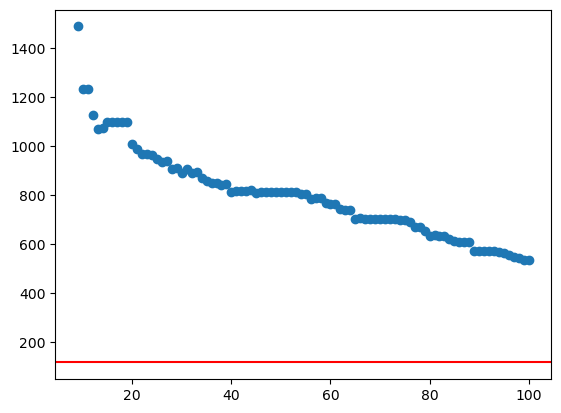

In [91]:
# check the rms based on the PCs
rms_old = get_rms_from_last_acts(acts)
rms_from_pcs = []

pca = PCA(n_components=100)
acts_pca = pca.fit_transform(acts.cpu().numpy())

for i in (pcs:=range(9, acts_pca.shape[1]+1)):
    acts_pca_ = acts_pca.copy()
    acts_pca_[:, i:] = 0
    acts_pca_ = pca.inverse_transform(acts_pca_)
    acts_ = torch.tensor(acts_pca_, device=device)
    rms_from_pcs.append(get_rms_from_last_acts(acts_))
print(rms_from_pcs, rms_old)
plt.scatter(pcs, rms_from_pcs)
plt.axhline(rms_old, color="red")

# L1 Sparse Autoencoder Experiment

In [39]:
from lib.model import AutoEncoder

ae = AutoEncoder(2048, 2048 * 10).to(device)

quick_eval(new_model)
acts = torch.zeros(len(X_train), 2048, device=device)
# save the activations fed into the readout layer
hook = new_model.readout.register_forward_pre_hook(lambda m, i: acts.copy_(i[0].detach()))
new_model(X_train)
hook.remove()

RMS for franken model: 7784.99
RMS for franken model (clipped): nan


/work/submit/kitouni/miniconda3/envs/sandbox/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/work/submit/kitouni/miniconda3/envs/sandbox/lib/python3.10/site-packages/numpy/core/_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [7]:
# train the autoencoder
optim = torch.optim.Adam(ae.parameters(), lr=1e-3)
epochs = 1_000
for epoch in (pbar := tqdm(range(epochs))):
    optim.zero_grad()
    preds, features = ae(acts)
    reco = torch.nn.functional.mse_loss(preds, acts)
    loss = reco + 1e-10 * (
        l1 := features.abs().mean()
    )  # L1 regularization on the features
    loss.backward()
    optim.step()
    pbar.set_description(f"Epoch {epoch}: {reco.item():.2e}, {l1.item():.2e}")

  0%|          | 0/10000 [00:00<?, ?it/s]

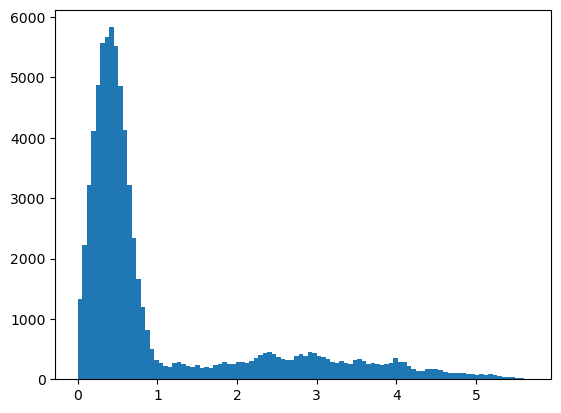

In [8]:
from matplotlib import pyplot as plt
a = features.abs()

plt.hist(a[a>0].cpu().detach().numpy(), bins=100)
plt.show()

# Model Loading and Evaluation

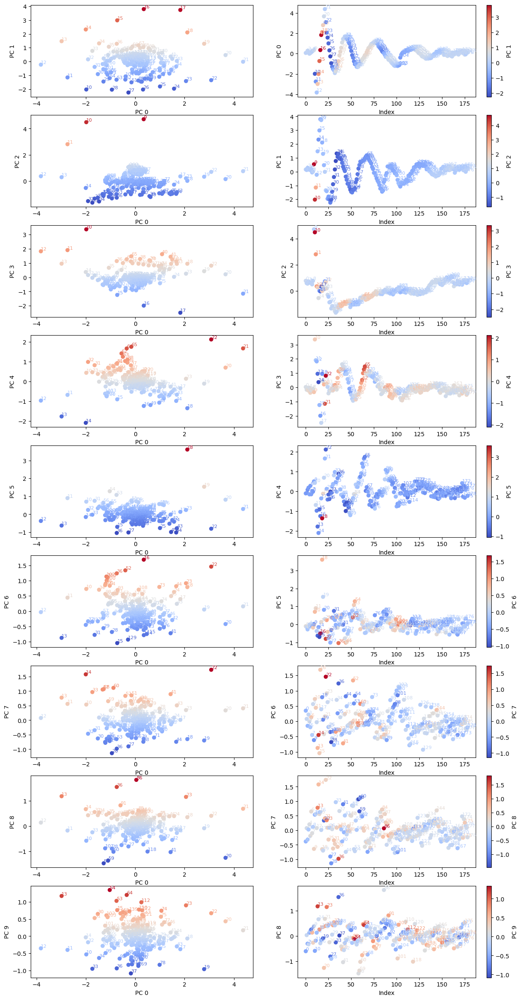

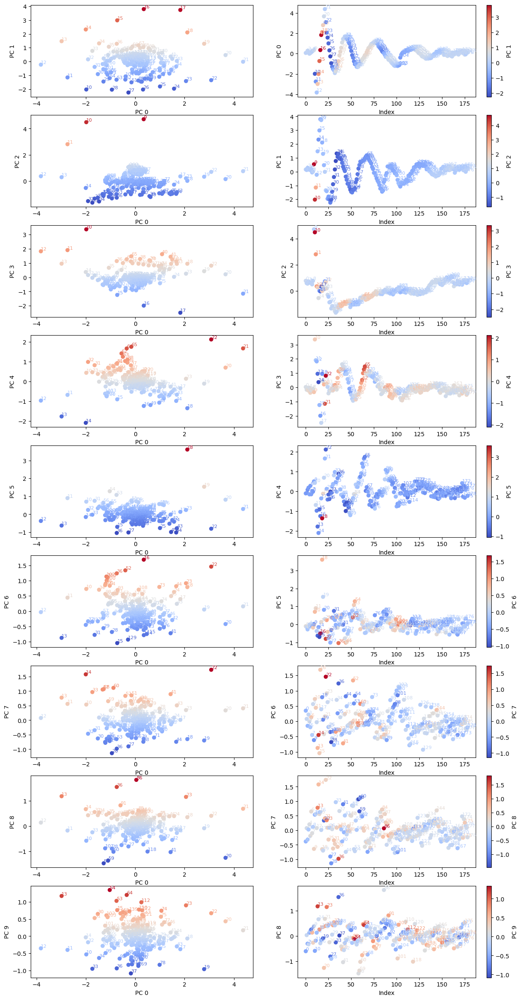

In [6]:
# let's take a look at our embeddings
embed = new_model.emb[1].detach().cpu().numpy()
PlottingContext.plot_embedding(embed, num_components=10)

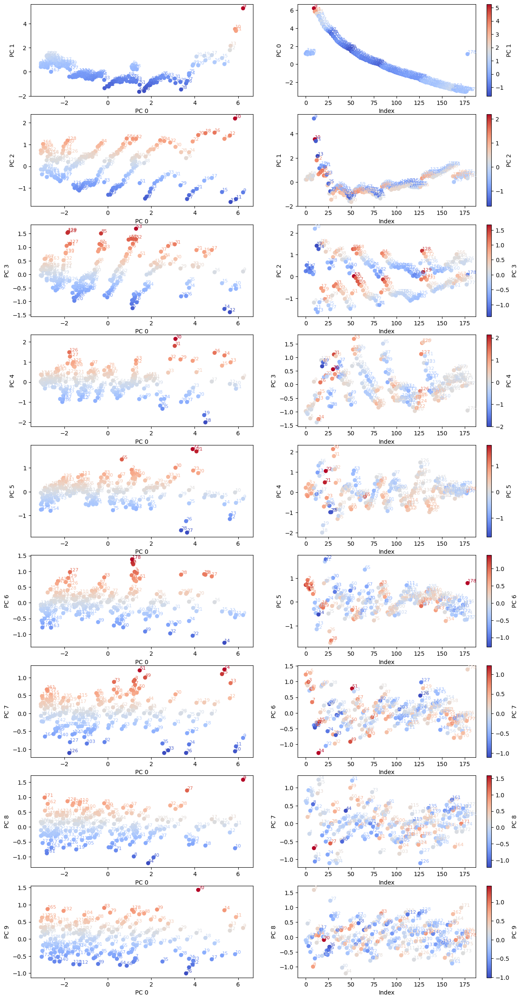

In [ ]:
# let's take a look at our embeddings
embed = new_model.emb[1].detach().cpu().numpy()
PlottingContext.plot_embedding(embed, num_components=10)

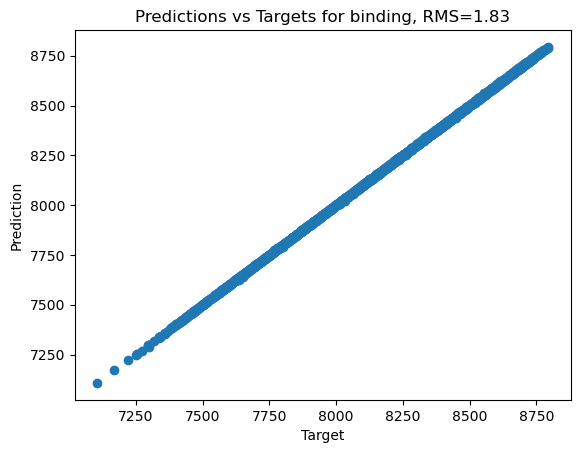

RMS: 1.83


In [ ]:
# visualize the predictions
PlottingContext.plot_predictions(data, new_model, "binding", train=True)

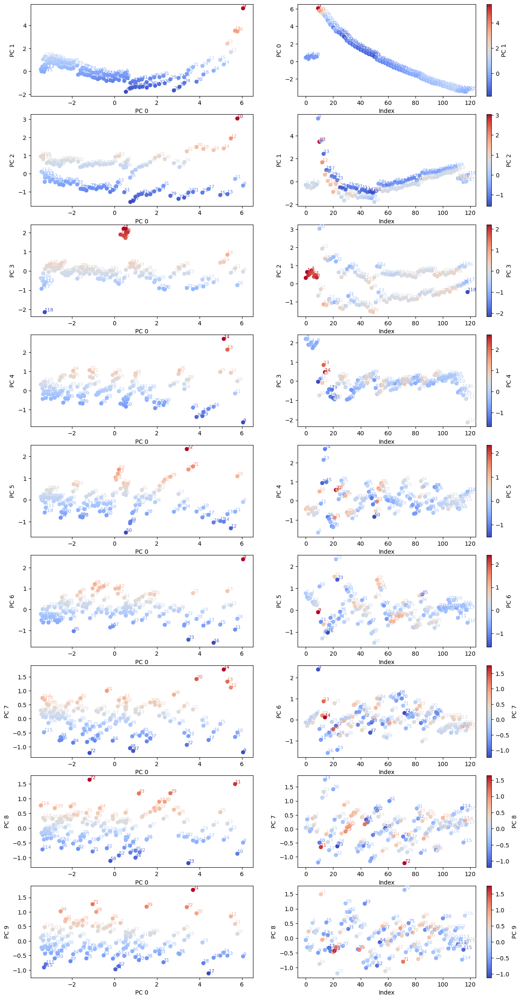

In [ ]:
# let's take a look at our embeddings
embed = new_model.emb[0].detach().cpu().numpy()
PlottingContext.plot_embedding(embed, num_components=10)

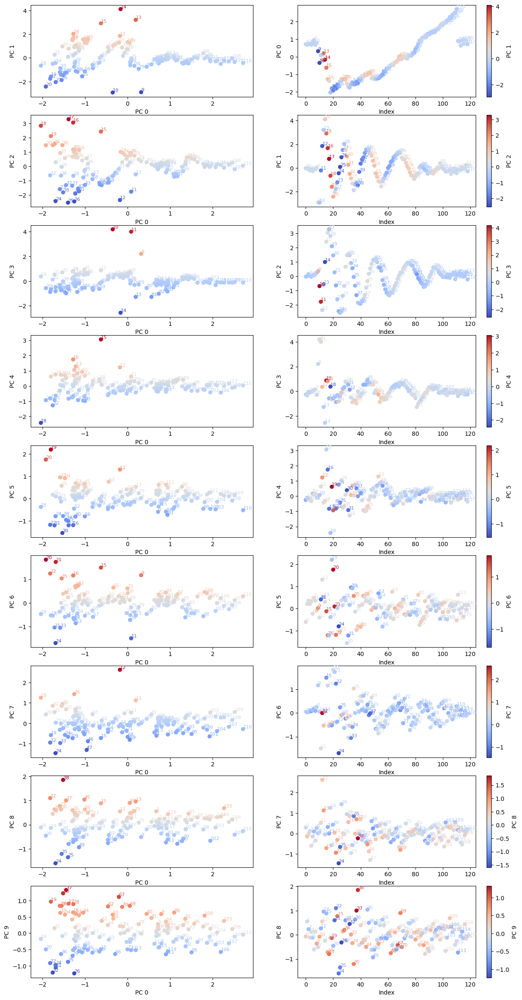

In [ ]:
# let's take a look at our embeddings
embed = new_model.emb[0].detach().cpu().numpy()
PlottingContext.plot_embedding(embed, num_components=10)

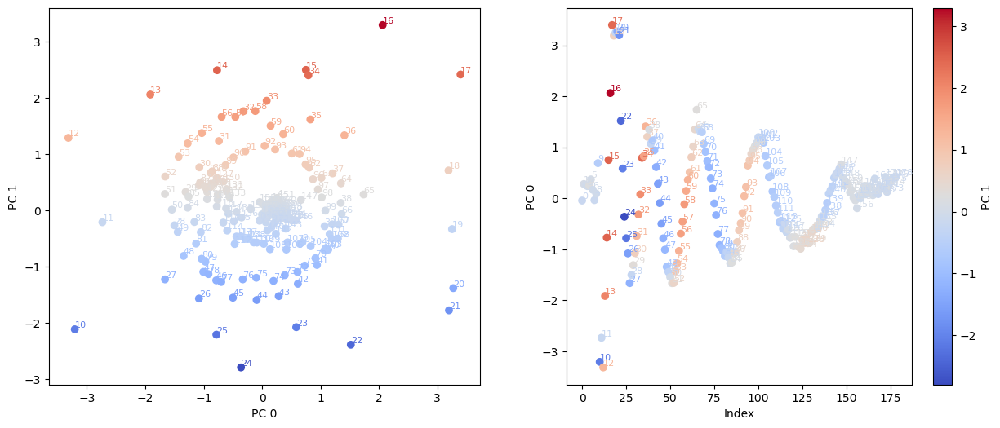

In [ ]:
# let's take a look at our embeddings
embed = new_model.emb[1].detach().cpu().numpy()
PlottingContext.plot_embedding(embed, num_components=3)

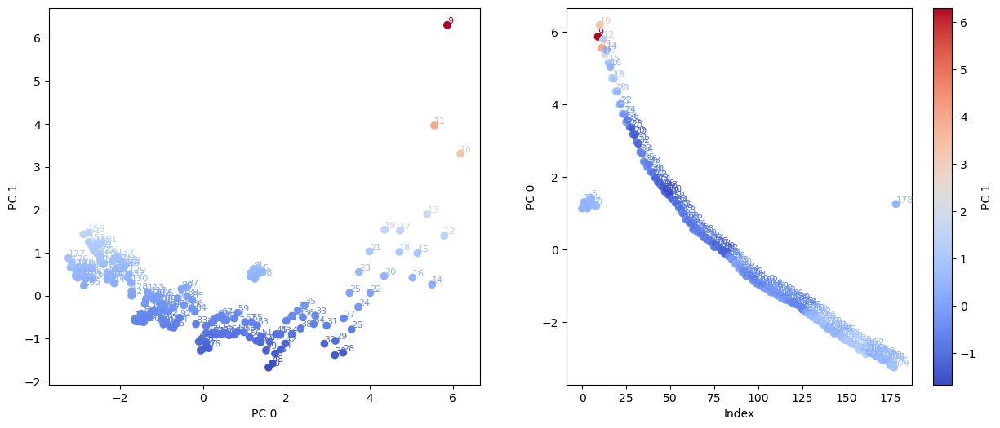

In [ ]:
# let's take a look at our embeddings
embed = new_model.emb[1].detach().cpu().numpy()
PlottingContext.plot_embedding(embed, num_components=2)

  0%|          | 0/20000 [00:00<?, ?it/s]

Epoch 0: 0.34
Train RMS radius: 415.61 (408.25) Epoch 2000: 0.00
Train RMS radius: 1.31 (1.20) Epoch 4000: 0.00
Train RMS radius: 1.23 (1.12) Epoch 6000: 0.00
Train RMS radius: 1.12 (1.03) Epoch 8000: 0.00
Train RMS radius: 0.90 (0.80) Epoch 10000: 0.00
Train RMS radius: 0.52 (0.44) Epoch 12000: 0.00
Train RMS radius: 0.21 (0.18) Epoch 14000: 0.00
Train RMS radius: 0.11 (0.09) Epoch 16000: 0.00
Train RMS radius: 0.05 (0.04) Epoch 18000: 0.00
Train RMS radius: 0.02 (0.02) 

  0%|          | 0/20000 [00:00<?, ?it/s]

Epoch 0: 0.26
Train RMS qa: 3566579.54 (3479769.49) Epoch 2000: 0.00
Train RMS qa: 153672.90 (136107.24) Epoch 4000: 0.00
Train RMS qa: 35655.21 (32733.99) Epoch 6000: 0.00
Train RMS qa: 20416.66 (18650.81) Epoch 8000: 0.00
Train RMS qa: 8313.04 (7358.03) Epoch 10000: 0.00
Train RMS qa: 3905.99 (3250.62) Epoch 12000: 0.00
Train RMS qa: 3214.90 (2929.03) Epoch 14000: 0.00
Train RMS qa: 1046.69 (788.70) Epoch 16000: 0.00
Train RMS qa: 624.42 (480.28) Epoch 18000: 0.00
Train RMS qa: 384.40 (301.87) 

  0%|          | 0/20000 [00:00<?, ?it/s]

Epoch 0: 0.04
Train RMS sp: 728210.10 (707785.36) Epoch 2000: 0.00
Train RMS sp: 36649.39 (34703.86) Epoch 4000: 0.00
Train RMS sp: 16027.77 (15184.83) Epoch 6000: 0.00
Train RMS sp: 4997.94 (4663.33) Epoch 8000: 0.00
Train RMS sp: 3320.03 (3209.48) Epoch 10000: 0.00
Train RMS sp: 511.17 (451.64) Epoch 12000: 0.00
Train RMS sp: 220.73 (190.12) Epoch 14000: 0.00
Train RMS sp: 1282.09 (1258.30) Epoch 16000: 0.00
Train RMS sp: 101.39 (91.22) Epoch 18000: 0.00
Train RMS sp: 78.75 (71.73) 

  0%|          | 0/20000 [00:00<?, ?it/s]

Epoch 0: 0.04
Train RMS sn: 737267.51 (723636.75) Epoch 2000: 0.00
Train RMS sn: 36457.20 (34697.78) Epoch 4000: 0.00
Train RMS sn: 15772.74 (14767.42) Epoch 6000: 0.00
Train RMS sn: 4316.43 (4024.73) Epoch 8000: 0.00
Train RMS sn: 1566.48 (1442.18) Epoch 10000: 0.00
Train RMS sn: 654.36 (599.51) Epoch 12000: 0.00
Train RMS sn: 340.31 (311.62) Epoch 14000: 0.00
Train RMS sn: 137.05 (119.90) Epoch 16000: 0.00
Train RMS sn: 98.03 (87.42) Epoch 18000: 0.00
Train RMS sn: 70.63 (63.65) 

  0%|          | 0/20000 [00:00<?, ?it/s]

Epoch 0: 0.11
Train RMS qbm_n: 3690699.56 (3636500.66) Epoch 2000: 0.00
Train RMS qbm_n: 73940.73 (70280.05) Epoch 4000: 0.00
Train RMS qbm_n: 47922.14 (45181.59) Epoch 6000: 0.00
Train RMS qbm_n: 24925.22 (23547.03) Epoch 8000: 0.00
Train RMS qbm_n: 10929.80 (10246.54) Epoch 10000: 0.00
Train RMS qbm_n: 4956.97 (4606.16) Epoch 12000: 0.00
Train RMS qbm_n: 2765.31 (2527.62) Epoch 14000: 0.00
Train RMS qbm_n: 1549.62 (1357.87) Epoch 16000: 0.00
Train RMS qbm_n: 993.05 (846.08) Epoch 18000: 0.00
Train RMS qbm_n: 704.44 (592.41) 

  0%|          | 0/20000 [00:00<?, ?it/s]

Epoch 0: 0.11
Train RMS qbm: 2780831.11 (2740853.56) Epoch 2000: 0.00
Train RMS qbm: 59877.95 (56511.65) Epoch 4000: 0.00
Train RMS qbm: 38568.62 (36171.20) Epoch 6000: 0.00
Train RMS qbm: 17724.00 (16605.22) Epoch 8000: 0.00
Train RMS qbm: 7556.89 (6999.07) Epoch 10000: 0.00
Train RMS qbm: 3564.67 (3262.97) Epoch 12000: 0.00
Train RMS qbm: 1803.68 (1621.28) Epoch 14000: 0.00
Train RMS qbm: 1017.80 (901.06) Epoch 16000: 0.00
Train RMS qbm: 2300.62 (2251.62) Epoch 18000: 0.00
Train RMS qbm: 409.72 (351.72) 

  0%|          | 0/20000 [00:00<?, ?it/s]

Epoch 0: 0.18
Train RMS qec: 3628993.27 (3570669.39) Epoch 2000: 0.00
Train RMS qec: 60087.27 (56652.33) Epoch 4000: 0.00
Train RMS qec: 37089.01 (34428.20) Epoch 6000: 0.00
Train RMS qec: 17884.52 (16639.70) Epoch 8000: 0.00
Train RMS qec: 8091.49 (7414.35) Epoch 10000: 0.00
Train RMS qec: 5558.15 (5217.74) Epoch 12000: 0.00
Train RMS qec: 2678.60 (2473.30) Epoch 14000: 0.00
Train RMS qec: 2194.69 (2101.50) Epoch 16000: 0.00
Train RMS qec: 2532.32 (2465.76) Epoch 18000: 0.00
Train RMS qec: 4173.95 (4119.50) 

  0%|          | 0/20000 [00:00<?, ?it/s]

Epoch 0: 0.01
Train RMS binding_semf: 63680.07 (62778.62) Epoch 2000: 0.00
Train RMS binding_semf: 1795.05 (1681.85) Epoch 4000: 0.00
Train RMS binding_semf: 280.99 (250.20) Epoch 6000: 0.00
Train RMS binding_semf: 85.09 (67.43) Epoch 8000: 0.00
Train RMS binding_semf: 83.45 (80.16) Epoch 10000: 0.00
Train RMS binding_semf: 16.45 (10.81) Epoch 12000: 0.00
Train RMS binding_semf: 101.65 (100.57) Epoch 14000: 0.00
Train RMS binding_semf: 5.89 (4.27) Epoch 16000: 0.00
Train RMS binding_semf: 3.84 (2.79) Epoch 18000: 0.00
Train RMS binding_semf: 3.13 (2.49) 

  0%|          | 0/20000 [00:00<?, ?it/s]

Epoch 0: 0.54
Train RMS binding: 860159.03 (852827.06) Epoch 2000: 0.00
Train RMS binding: 13294.40 (12785.52) Epoch 4000: 0.00
Train RMS binding: 12872.34 (12363.36) Epoch 6000: 0.00
Train RMS binding: 2448.12 (2245.37) Epoch 8000: 0.00
Train RMS binding: 686.31 (625.91) Epoch 10000: 0.00
Train RMS binding: 244.86 (224.28) Epoch 12000: 0.00
Train RMS binding: 186.38 (179.06) Epoch 14000: 0.00
Train RMS binding: 314.69 (310.79) Epoch 16000: 0.00
Train RMS binding: 216.50 (213.88) Epoch 18000: 0.00
Train RMS binding: 25.76 (24.28) 

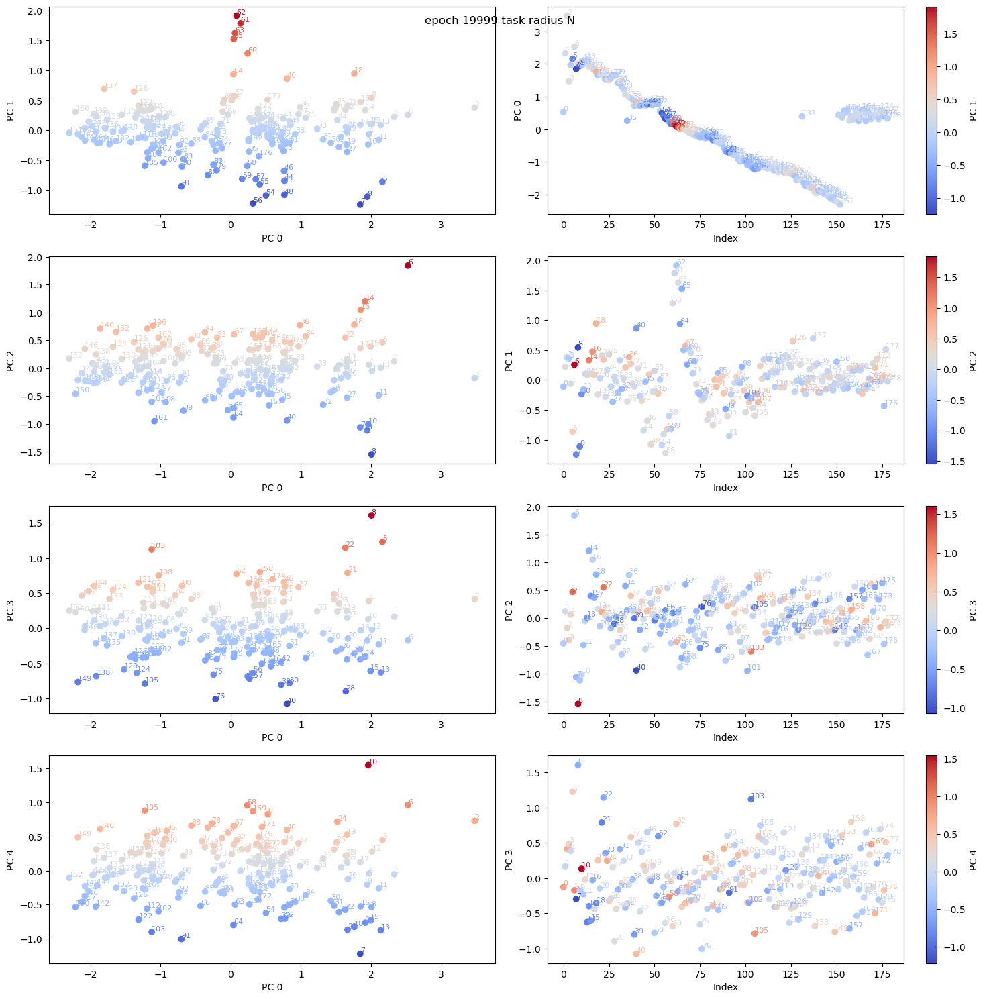

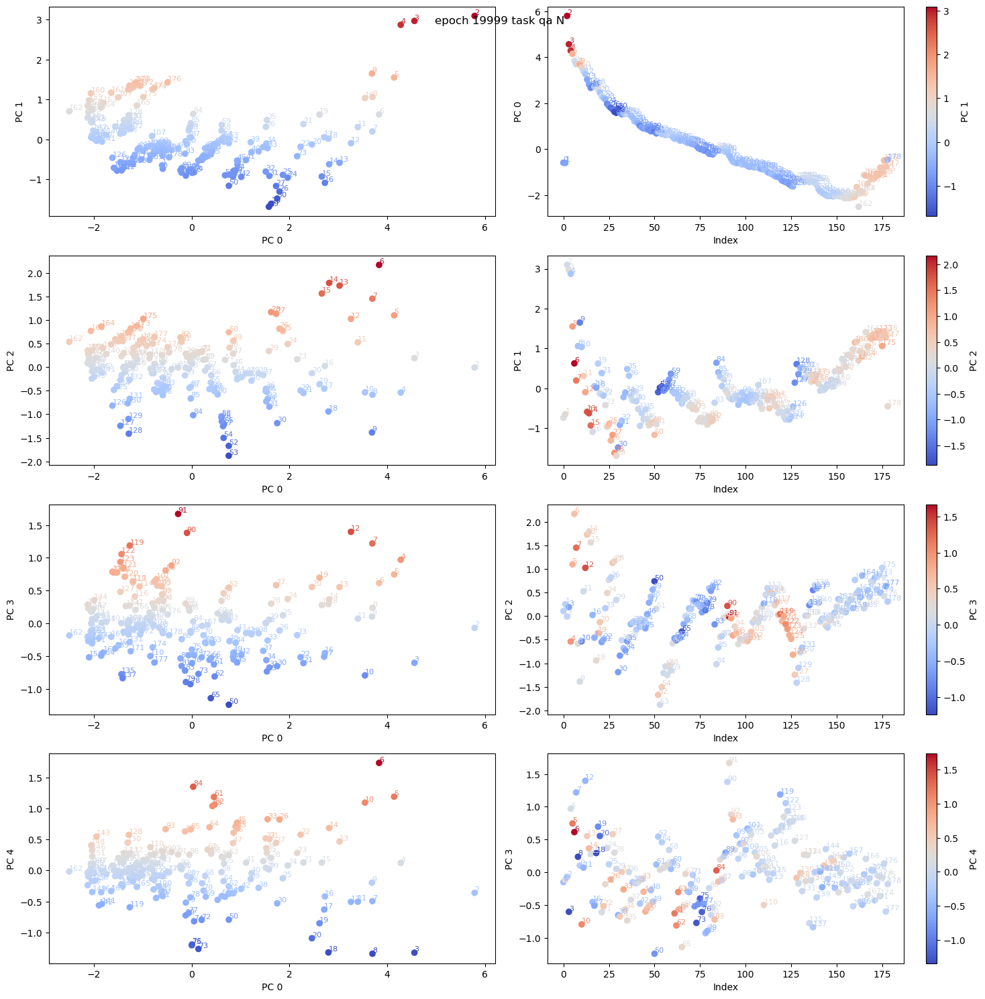

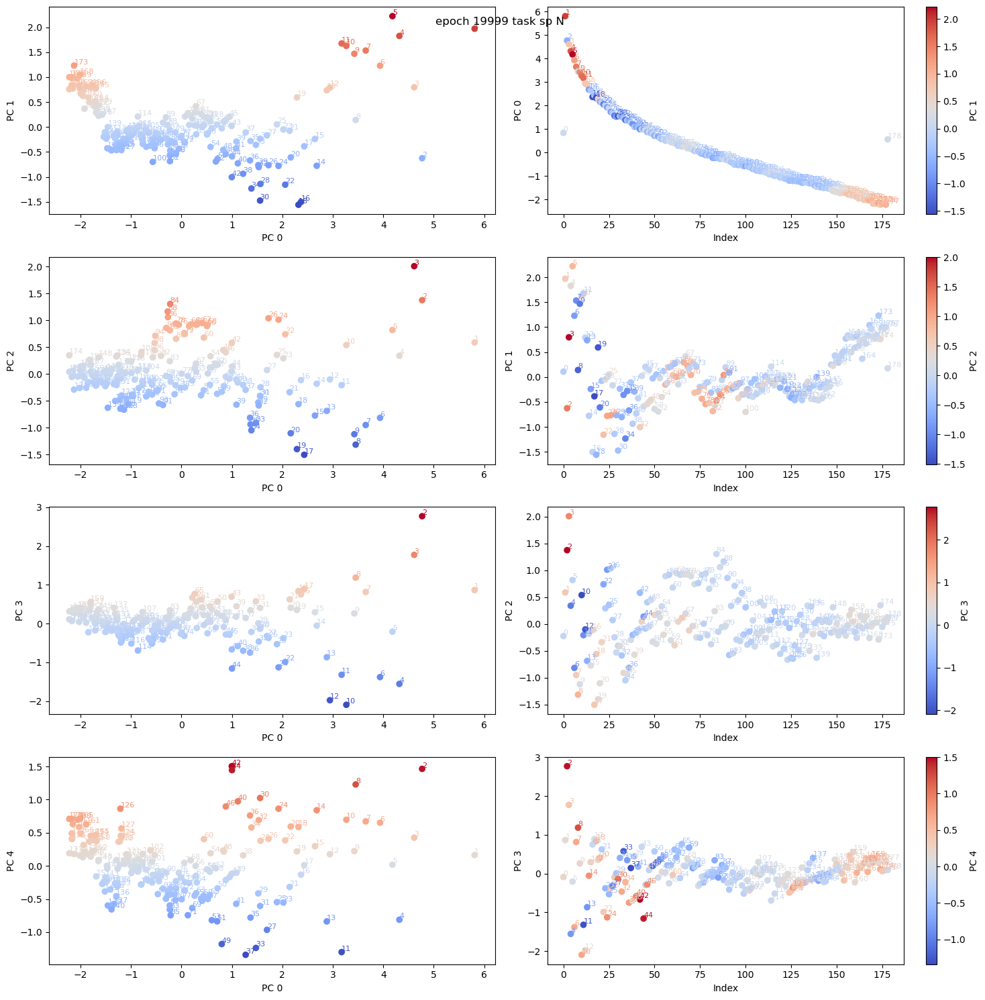

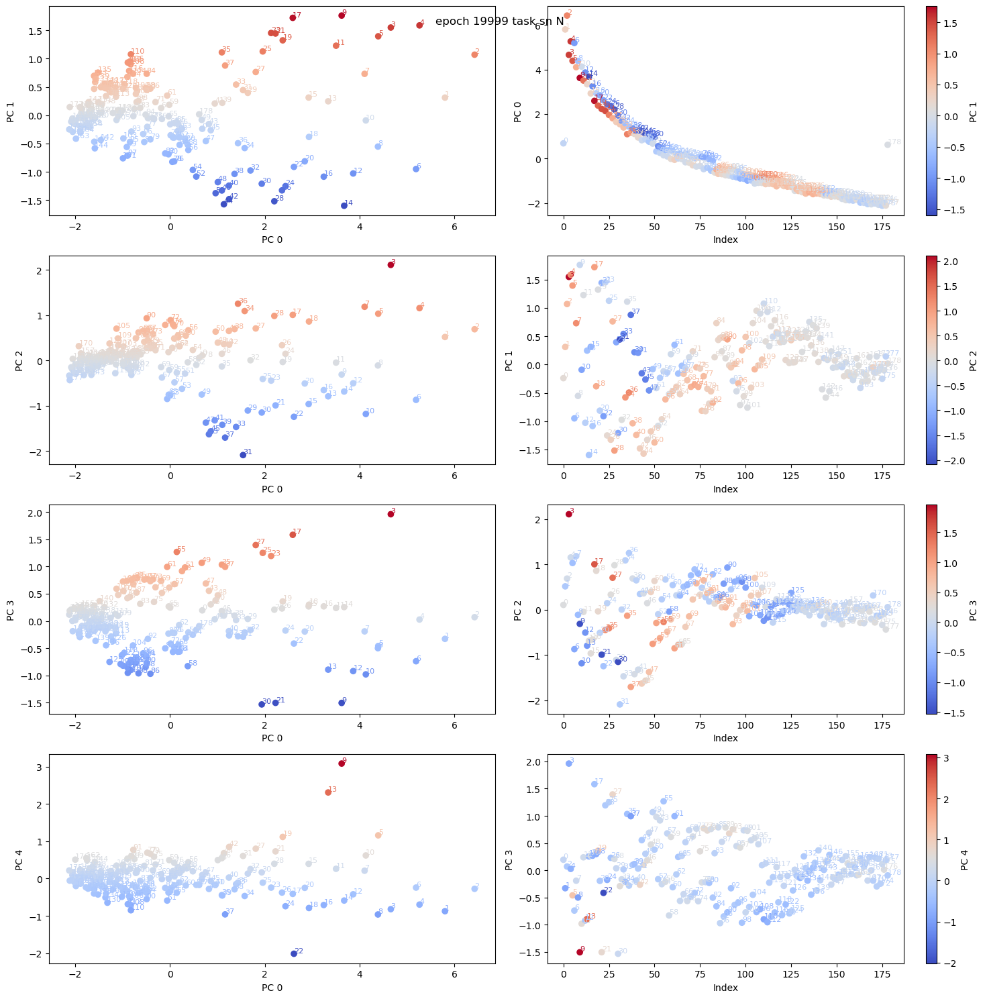

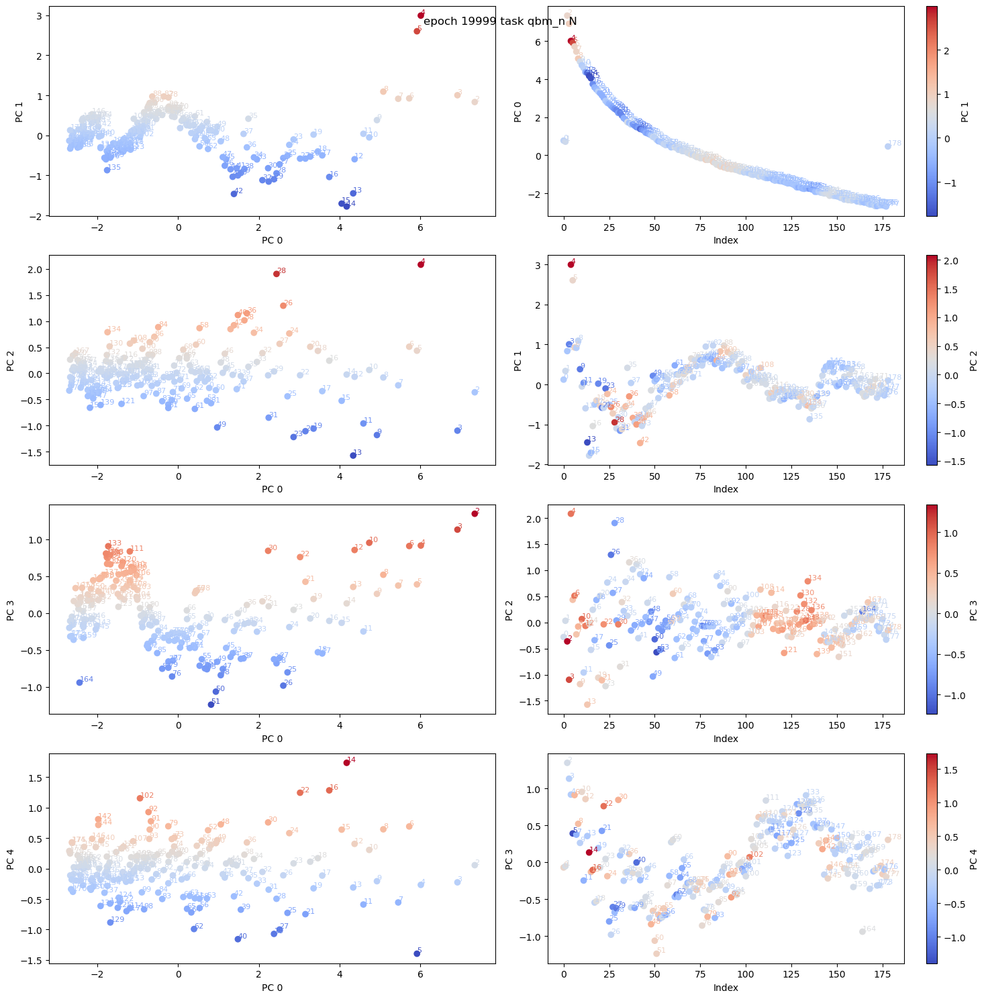

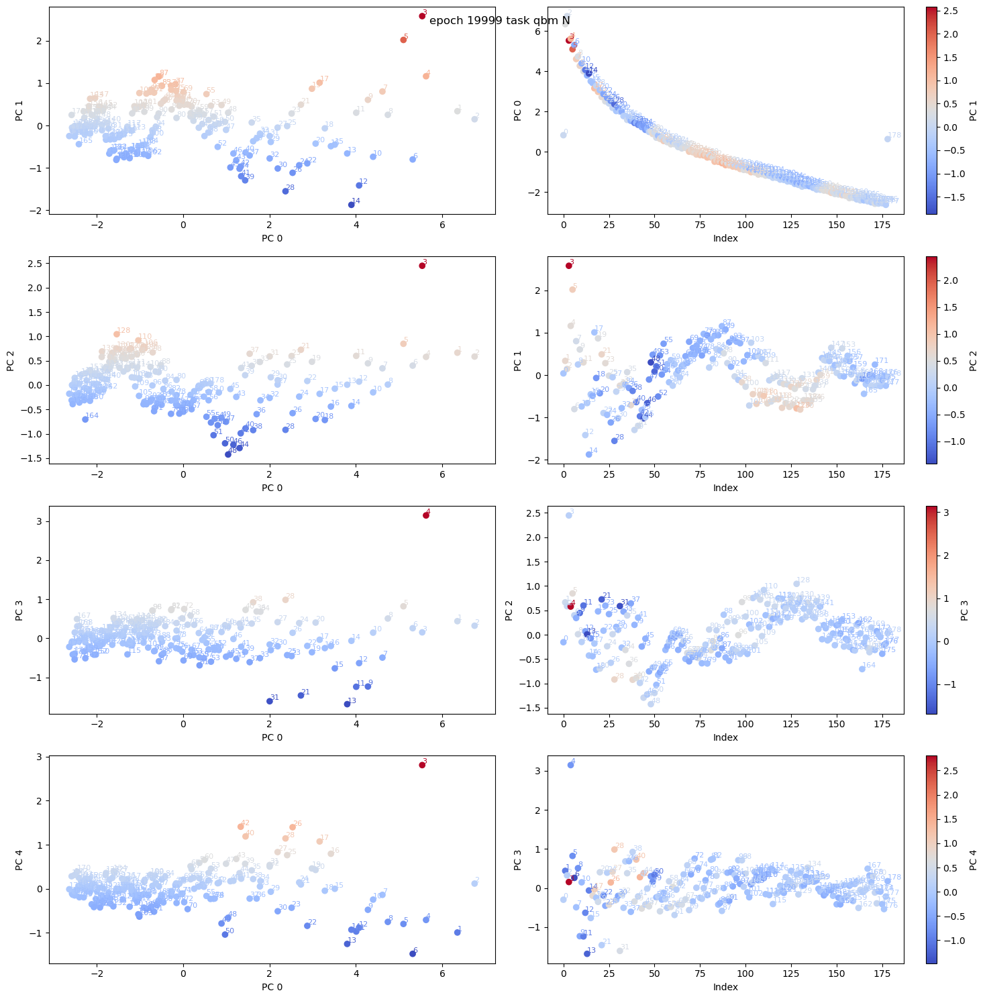

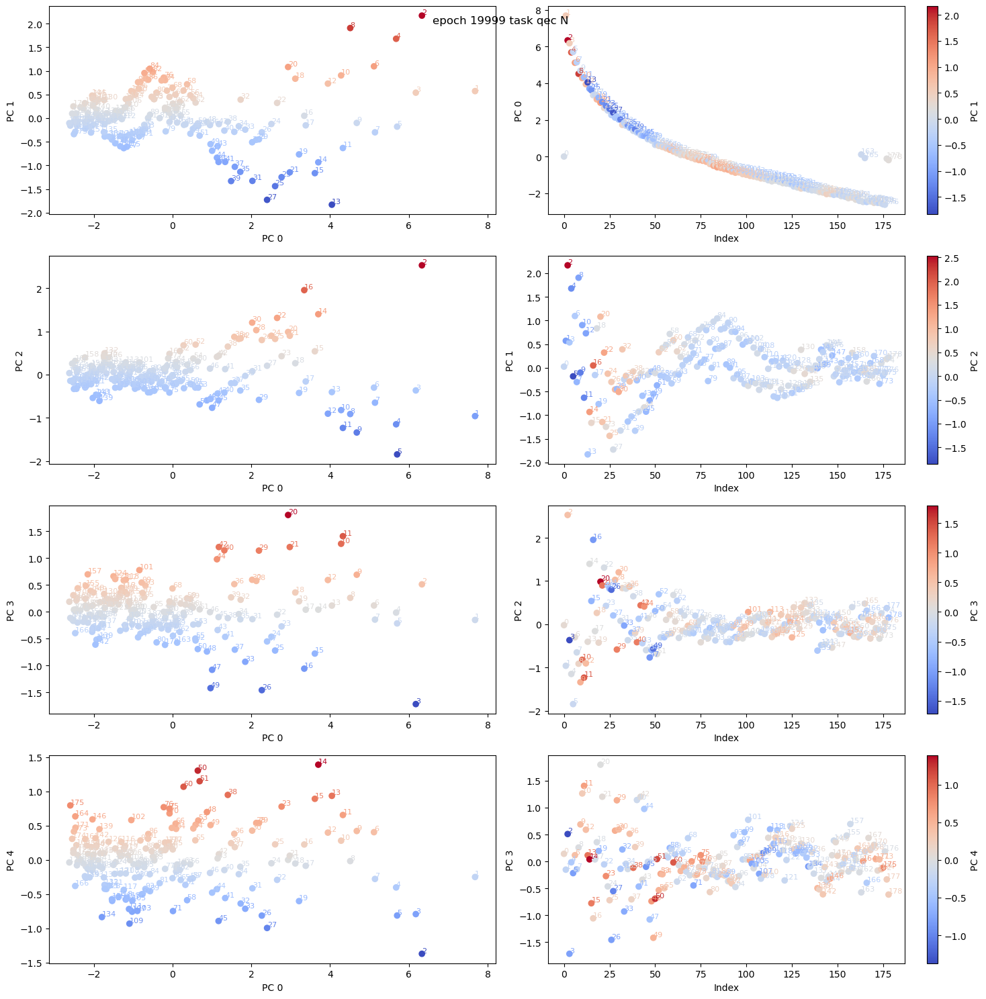

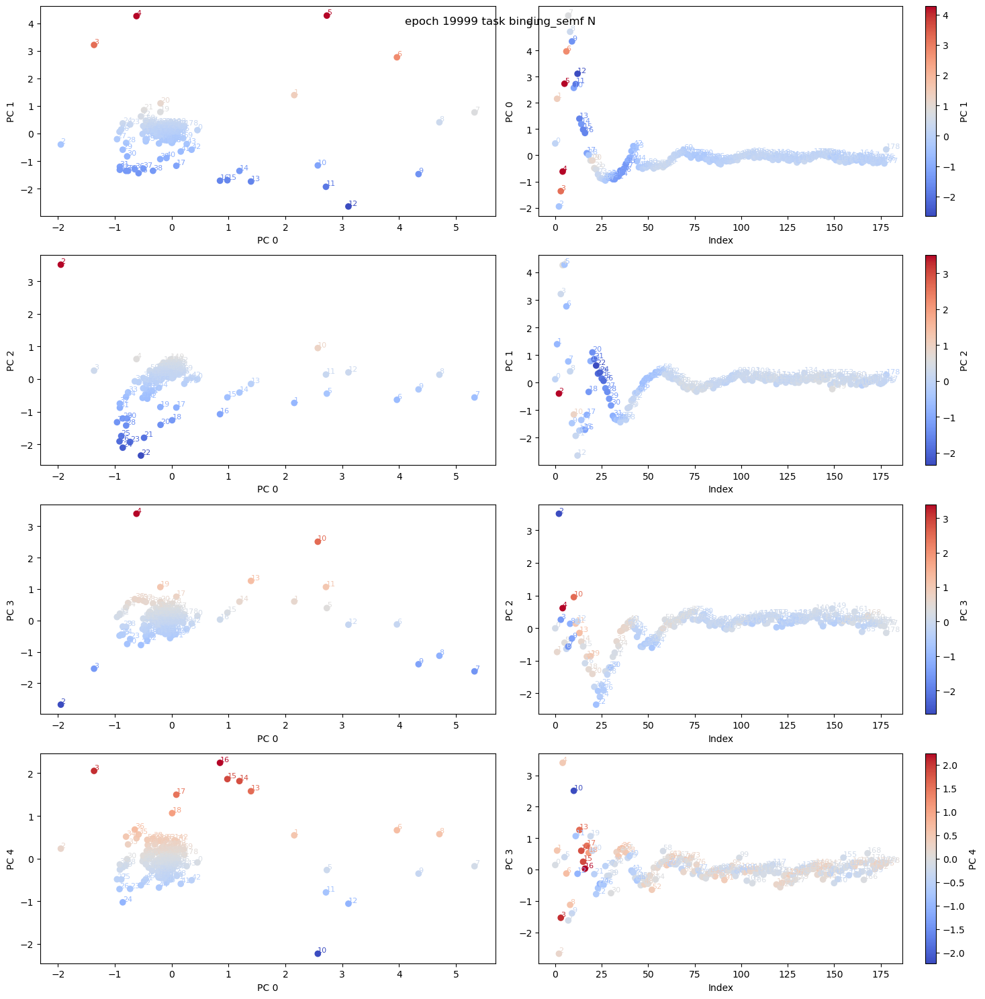

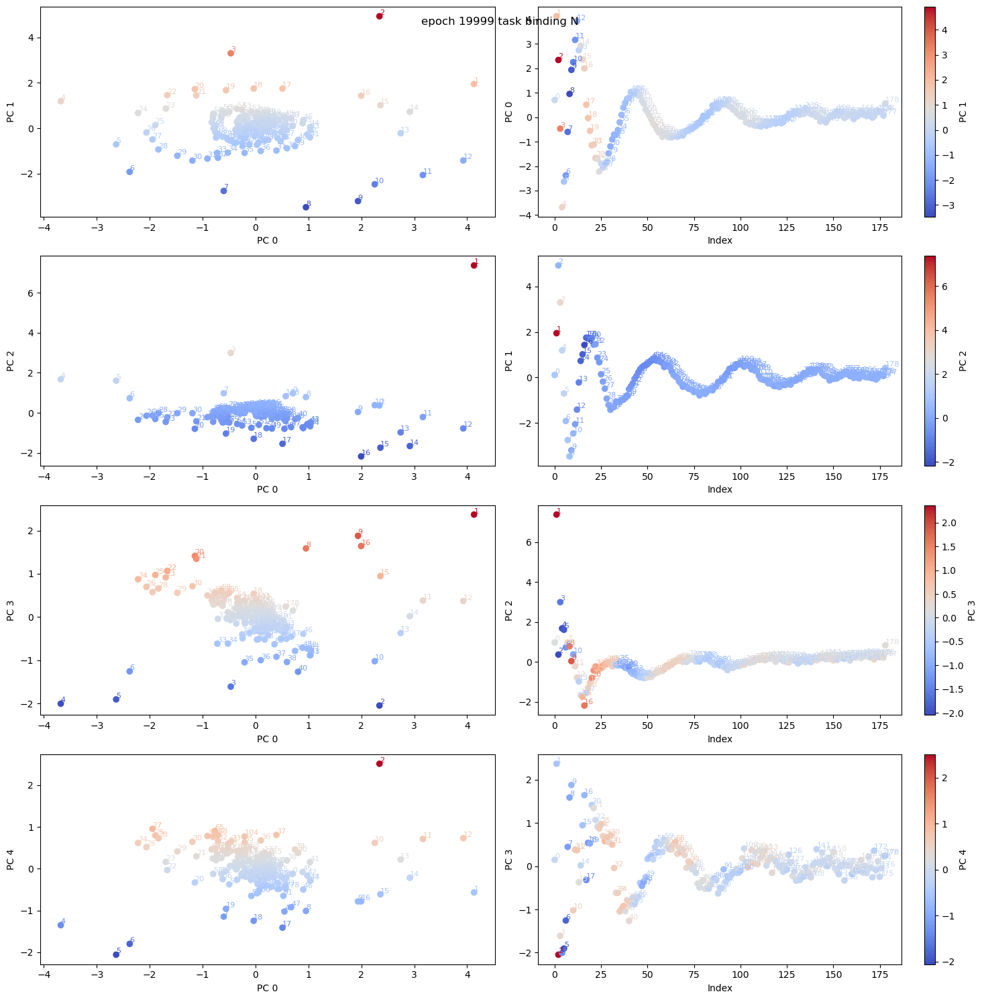

In [ ]:
# loop

for task in ["radius", "qa", "sp", "sn", "qbm_n", "qbm", "qec",  "binding_semf","binding"]:
    experiment_name = f"which_task_has_what_feature/{task}"
    os.makedirs("experiments", exist_ok=True)
    os.makedirs(f"experiments/{experiment_name}", exist_ok=True)
    args = {
        "DEPTH": 2,
        "DEV": (device:="cuda"),
        "EPOCHS": 20_000,
        "HIDDEN_DIM": 2048,
        "LR": 0.0001,
        "MODEL": "baseline",
        "SIGMOID_READOUT": "false",
        "TMS": "remove",
        "WD": 0.01,
        "DEV": "cuda",
        "TARGETS_CLASSIFICATION": {},
        "TARGETS_REGRESSION": {f"{task}": 100},
        "TRAIN_FRAC": 1,
        "LIPSCHITZ": "false",
        "TRAIN_SET": "all_data", # random, all_data, extrap_1, extrap_2, extrap_3
        "BATCH_SIZE": 1024,
        "LOG_TIMES": 10,
        "NUCLEI_GE": 0,
        "NUCLEI_HIGH_UNC": "keep",
        "PER_NUCLEON": "true",
        "SEED": 0,
    }

    args = Namespace(**args)

    IO.save_args(args, f"experiments/{experiment_name}/args.yaml")

    data = prepare_nuclear_data(args)


    # setup training data
    X_train = data.X[data.train_mask]
    y_train = data.y[data.train_mask]
    non_nan_targets = ~torch.isnan(y_train.view(-1))
    X_train = X_train[non_nan_targets]
    y_train = y_train[non_nan_targets]

    def quick_eval(model, task="binding", verbose=True, train=False):
        """helper to get the rms for the franken model"""
        preds, targets, zn = preds_targets_zn(data, model, task, train=train)
        rms = get_rms(preds, targets, zn, scale_by_A=True)
        rms_clip = get_rms_no_outliers(preds, targets, zn, scale_by_A=args.PER_NUCLEON=="true")
        if verbose:
            print(f"RMS for franken model: {rms:.2f}")
            print(f"RMS for franken model (clipped): {rms_clip:.2f}")
        return rms, rms_clip

    torch.manual_seed(1)
    new_model, optim_model = get_model_and_optim(data, args)

    # train the new model
    epochs = args.EPOCHS
    task_name = list(data.output_map.keys())[0]
    for epoch in (pbar:=tqdm(range(epochs))):
        optim_model.zero_grad()
        preds = new_model(X_train)
        preds = preds.gather(1, X_train[:, 2].long().view(-1, 1))
        loss = torch.nn.functional.mse_loss(preds, y_train)
        loss.backward()
        optim_model.step()
        if epoch % (epochs//10) == 0:
            print(f"Epoch {epoch}: {loss.item():.2f}")
            train_rms = quick_eval(new_model, task_name, verbose=False, train=True)
            # val_rms = quick_eval(new_model, "binding", verbose=False, train=False)
            print(f"Train RMS {task_name}: {train_rms[0]:.2f} ({train_rms[1]:.2f})", end=" ")
            # print(f"Val RMS: {val_rms[0]:.2f} ({val_rms[1]:.2f})")
            embed = new_model.emb[1].detach().cpu().numpy()
            # PlottingContext.plot_embedding(embed, num_components=3); plt.show()
        pbar.set_description(f"Epoch {epoch}: {loss.item():.2e}")

    # let's take a look at our embeddings
    nucleons = "ZN" 
    embed = new_model.emb[(nucleon:=1)].detach().cpu().numpy()
    fig = PlottingContext.plot_embedding(embed, num_components=5)
    fig.suptitle(f"epoch {epoch} task {task_name} {nucleons[nucleon]}")
    fig.savefig(f"experiments/{experiment_name}/embedding.png", dpi=300)
    fig.show()